In [1]:
import pandas as pd
import numpy as np
import pandas as pd
import statistics
import os
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from plotly.offline import init_notebook_mode, iplot, plot
import plotly as py
init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.express as px
import statistics as stat
from scipy.stats import binom
from sklearn.preprocessing import StandardScaler
from matplotlib.patches import Rectangle
# splitting merge_data into train test and split
from sklearn.model_selection import train_test_split, cross_validate
from scipy import stats
from scipy.stats import normaltest
import os 
from sklearn.preprocessing import MinMaxScaler
from sklearn import preprocessing
import matplotlib as mpl
import warnings; warnings.filterwarnings(action='once')
# to keep track of training time
import datetime
# logistic regression model
from sklearn.linear_model import LogisticRegression
# metrics used for evaluation
from sklearn.metrics import f1_score, matthews_corrcoef
# visualizations
from yellowbrick.classifier import ClassPredictionError, ConfusionMatrix
from sklearn.metrics import plot_roc_curve
# KNN imputation
from sklearn.impute import KNNImputer
# normalizer
from sklearn.preprocessing import Normalizer
# variance threshold
from sklearn.feature_selection import VarianceThreshold
# RFECV
from sklearn.model_selection import StratifiedKFold
# random forest
from sklearn.ensemble import RandomForestClassifier
# evaluation metric
from sklearn.metrics import matthews_corrcoef, make_scorer
from scipy import stats 
from sklearn.model_selection import KFold, StratifiedKFold, train_test_split 
from sklearn.model_selection import cross_val_score # Evaluate a score by cross-validation
from sklearn.model_selection import GridSearchCV # Exhaustive search over specified parameter values for an estimator
from sklearn.metrics import classification_report # Build a text report showing the main classification metrics
from sklearn.metrics import accuracy_score # Accuracy classification score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay # to show confusion matrix
from sklearn import metrics # Evaluate ROC curve
from sklearn.experimental import enable_iterative_imputer # Enables IterativeImputer. The API and results of this estimator might change without any deprecation cycle
from sklearn.impute import IterativeImputer
from imblearn.combine import SMOTEENN # Combine over- and under-sampling using SMOTE and Edited Nearest Neighbours
from sklearn import decomposition
from boruta import BorutaPy
from imblearn.over_sampling import SMOTE, ADASYN, RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from collections import Counter
from sklearn.metrics import plot_confusion_matrix
from matplotlib.colors import ListedColormap




KeyboardInterrupt: 

In [46]:
df = pd.read_csv("LoanStats.csv")

In [47]:
df.shape

(39786, 7)

# Data Understanding

In [49]:
observed1 = df["term"].value_counts()
observed1

36    29096
60    10690
Name: term, dtype: int64

In [105]:
#plt.scatter(df.loan_amnt,df.int_rate)

In [51]:
import plotly.express as px
fig = px.box(df, x="term", y="int_rate")
fig.show()

c:\ProgramData\Anaconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



In [52]:
observed = df["purpose"].value_counts()
observed

debt_consolidation    18676
credit_card            5137
other                  4001
home_improvement       2985
major_purchase         2188
small_business         1831
car                    1551
wedding                 948
medical                 695
moving                  583
house                   382
vacation                381
educational             325
renewable_energy        103
Name: purpose, dtype: int64

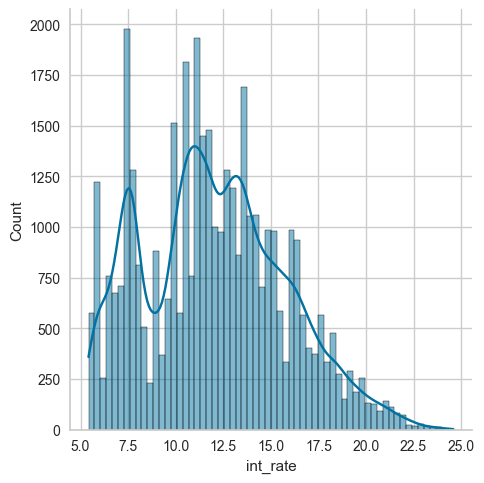

In [53]:
sns.displot(data=df, x="int_rate", kde=True)

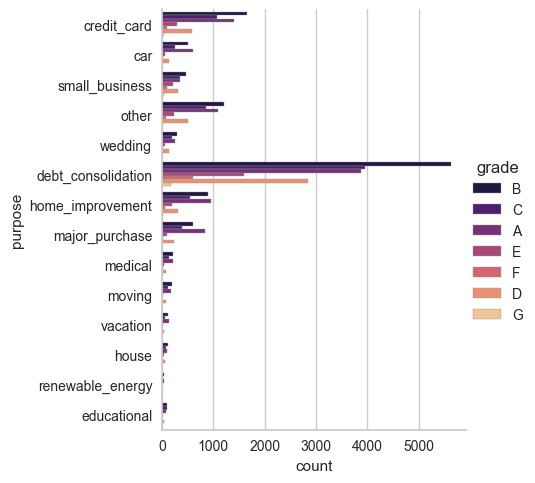

In [54]:

sns.catplot(
    data=df, y="purpose", hue="grade", kind="count",
    palette="magma", edgecolor=".6",
)

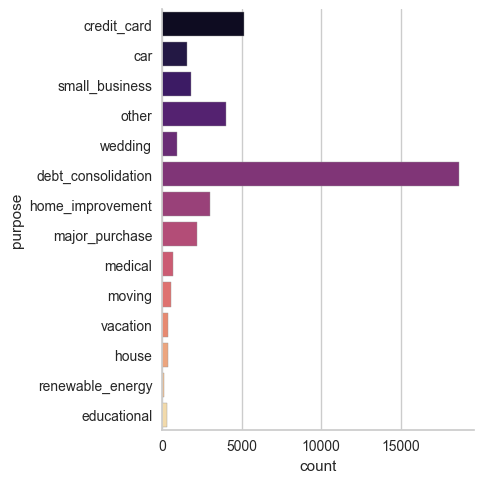

In [55]:
sns.catplot(
    data=df, y="purpose", kind="count",
    palette="magma", edgecolor=".6",
)

In [56]:
df.describe()

,int_rate,loan_amnt,term,annual_inc
count,39786.000000,39786.000000,39786.000000,3.978600e+04
mean,12.027873,11231.360277,42.448499,6.897907e+04
std,3.727466,7464.542832,10.638782,6.376263e+04
min,5.420000,500.000000,36.000000,4.000000e+03
25%,9.250000,5500.000000,36.000000,4.050000e+04
50%,11.860000,10000.000000,36.000000,5.900000e+04
75%,14.590000,15000.000000,60.000000,8.234250e+04
max,24.590000,35000.000000,60.000000,6.000000e+06


In [57]:
import plotly.express as px
fig = px.box(df, x="purpose", y="int_rate")
fig.show()

c:\ProgramData\Anaconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



In [58]:
import plotly.express as px
fig = px.box(df, x="grade", y="int_rate")
fig.show()

c:\ProgramData\Anaconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



In [59]:
import plotly.express as px

fig = px.box(df, x="purpose", y="int_rate", color="home_ownership")
fig.update_traces(quartilemethod="exclusive") # or "inclusive", or "linear" by default
fig.show()

c:\ProgramData\Anaconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



In [60]:

fig = px.box(df, x="purpose", y="int_rate", color="grade")
fig.update_traces(quartilemethod="exclusive") # or "inclusive", or "linear" by default
fig.show()

c:\ProgramData\Anaconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



In [61]:
## check binning and creating categorical data 

# Data Preparation

In [62]:
#Checking if there is any missing value in the data 
df.isna().any().any()

False

### creating spark session


In [64]:
import pyspark as ps

In [65]:
from pyspark.sql import SparkSession
from pyspark.ml.feature import StringIndexer

In [66]:
spark =SparkSession.builder.getOrCreate()

In [83]:
# File location and type
file_location = "LoanStats.csv"
file_type = "csv"

# CSV options
infer_schema = "false"
first_row_is_header = "true"
delimiter = ","

# The applied options are for CSV files. For other file types, these will be ignored.
df = spark.read.format(file_type) \
  .option("inferSchema", infer_schema) \
  .option("header", first_row_is_header) \
  .option("sep", delimiter) \
  .load(file_location)

display(df)

DataFrame[int_rate: string, loan_amnt: string, term: string, grade: string, home_ownership: string, annual_inc: string, purpose: string]

In [84]:
# Create a temporary table
df.createOrReplaceTempView("df")

In [73]:
spark.sql("select * from df ").show()

+--------+---------+----+-----+--------------+----------+------------------+
|int_rate|loan_amnt|term|grade|home_ownership|annual_inc|           purpose|
+--------+---------+----+-----+--------------+----------+------------------+
|   10.65|     5000|  36|    B|          RENT|     24000|       credit_card|
|   15.27|     2500|  60|    C|          RENT|     30000|               car|
|   15.96|     2400|  36|    C|          RENT|     12252|    small_business|
|   13.49|    10000|  36|    C|          RENT|     49200|             other|
|   12.69|     3000|  60|    B|          RENT|     80000|             other|
|    7.90|     5000|  36|    A|          RENT|     36000|           wedding|
|   15.96|     7000|  60|    C|          RENT|     47004|debt_consolidation|
|   18.64|     3000|  36|    E|          RENT|     48000|               car|
|   21.28|     5600|  60|    F|           OWN|     40000|    small_business|
|   12.69|     5375|  60|    B|          RENT|     15000|             other|

In [91]:
from pyspark.sql.types import IntegerType

In [96]:
# change the data type of int_rate, loan_amnt and annual_inc from string to integer
df=df.withColumn("int_rate",df["int_rate"].cast(IntegerType())).withColumn("loan_amnt",df["loan_amnt"].cast(IntegerType())).withColumn("annual_inc",df["annual_inc"].cast(IntegerType()))

In [97]:
df.printSchema()

root
 |-- int_rate: integer (nullable = true)
 |-- loan_amnt: integer (nullable = true)
 |-- term: string (nullable = true)
 |-- grade: string (nullable = true)
 |-- home_ownership: string (nullable = true)
 |-- annual_inc: integer (nullable = true)
 |-- purpose: string (nullable = true)



### Transform Categorical Data

In [86]:
from pyspark.ml.feature import StringIndexer

In [104]:
df.groupBy("grade").count().show()

+-----+-----+
|grade|count|
+-----+-----+
|    F| 1054|
|    E| 2858|
|    B|12035|
|    D| 5325|
|    C| 8111|
|    A|10085|
|    G|  318|
+-----+-----+



In [110]:
# StringIndexer
indexer = StringIndexer(inputCols= ["term","grade","home_ownership","purpose"], outputCols=["term_string_index","grade_string_index","home_ownership_string_index","purpose_string_index"]).fit(df).transform(df)
indexer.show()

+--------+---------+----+-----+--------------+----------+------------------+-----------------+------------------+---------------------------+--------------------+
|int_rate|loan_amnt|term|grade|home_ownership|annual_inc|           purpose|term_string_index|grade_string_index|home_ownership_string_index|purpose_string_index|
+--------+---------+----+-----+--------------+----------+------------------+-----------------+------------------+---------------------------+--------------------+
|      10|     5000|  36|    B|          RENT|     24000|       credit_card|              0.0|               0.0|                        0.0|                 1.0|
|      15|     2500|  60|    C|          RENT|     30000|               car|              1.0|               2.0|                        0.0|                 6.0|
|      15|     2400|  36|    C|          RENT|     12252|    small_business|              0.0|               2.0|                        0.0|                 5.0|
|      13|    10000|  

In [111]:
# from pyspark.ml.feature import OneHotEncoder
from pyspark.ml.feature import OneHotEncoder

In [112]:
encoder = OneHotEncoder(inputCols=["term_string_index","grade_string_index","home_ownership_string_index","purpose_string_index"], outputCols=["term_onehot","grade_onehot","home_ownersip_onehot","purpose_onehot"]).fit(indexer).transform(indexer)
encoder.show()

+--------+---------+----+-----+--------------+----------+------------------+-----------------+------------------+---------------------------+--------------------+-------------+-------------+--------------------+--------------+
|int_rate|loan_amnt|term|grade|home_ownership|annual_inc|           purpose|term_string_index|grade_string_index|home_ownership_string_index|purpose_string_index|  term_onehot| grade_onehot|home_ownersip_onehot|purpose_onehot|
+--------+---------+----+-----+--------------+----------+------------------+-----------------+------------------+---------------------------+--------------------+-------------+-------------+--------------------+--------------+
|      10|     5000|  36|    B|          RENT|     24000|       credit_card|              0.0|               0.0|                        0.0|                 1.0|(1,[0],[1.0])|(6,[0],[1.0])|       (4,[0],[1.0])|(13,[1],[1.0])|
|      15|     2500|  60|    C|          RENT|     30000|               car|              1.

In [114]:
encoder.select("term_string_index","term_onehot").show()

+-----------------+-------------+
|term_string_index|  term_onehot|
+-----------------+-------------+
|              0.0|(1,[0],[1.0])|
|              1.0|    (1,[],[])|
|              0.0|(1,[0],[1.0])|
|              0.0|(1,[0],[1.0])|
|              1.0|    (1,[],[])|
|              0.0|(1,[0],[1.0])|
|              1.0|    (1,[],[])|
|              0.0|(1,[0],[1.0])|
|              1.0|    (1,[],[])|
|              1.0|    (1,[],[])|
|              1.0|    (1,[],[])|
|              0.0|(1,[0],[1.0])|
|              0.0|(1,[0],[1.0])|
|              0.0|(1,[0],[1.0])|
|              0.0|(1,[0],[1.0])|
|              0.0|(1,[0],[1.0])|
|              0.0|(1,[0],[1.0])|
|              0.0|(1,[0],[1.0])|
|              0.0|(1,[0],[1.0])|
|              0.0|(1,[0],[1.0])|
+-----------------+-------------+
only showing top 20 rows



In [ ]:
## Vector assmbler gather column in order to train ML models 

In [117]:
from pyspark.ml.linalg import Vectors
from pyspark.ml.feature import VectorAssembler

In [119]:
encoder.columns

['int_rate',
 'loan_amnt',
 'term',
 'grade',
 'home_ownership',
 'annual_inc',
 'purpose',
 'term_string_index',
 'grade_string_index',
 'home_ownership_string_index',
 'purpose_string_index',
 'term_onehot',
 'grade_onehot',
 'home_ownersip_onehot',
 'purpose_onehot']

In [121]:
assembler= VectorAssembler(inputCols=["loan_amnt","term_onehot","annual_inc"], outputCol="features")

In [124]:
output =assembler.transform(encoder)

In [125]:
output.select("features").show()

+--------------------+
|            features|
+--------------------+
|[5000.0,1.0,24000.0]|
|[2500.0,0.0,30000.0]|
|[2400.0,1.0,12252.0]|
|[10000.0,1.0,4920...|
|[3000.0,0.0,80000.0]|
|[5000.0,1.0,36000.0]|
|[7000.0,0.0,47004.0]|
|[3000.0,1.0,48000.0]|
|[5600.0,0.0,40000.0]|
|[5375.0,0.0,15000.0]|
|[6500.0,0.0,72000.0]|
|[12000.0,1.0,7500...|
|[9000.0,1.0,30000.0]|
|[3000.0,1.0,15000.0]|
|[10000.0,1.0,1000...|
|[1000.0,1.0,28000.0]|
|[10000.0,1.0,4200...|
|[3600.0,1.0,11000...|
|[6000.0,1.0,84000.0]|
|[9200.0,1.0,77385.0]|
+--------------------+
only showing top 20 rows



In [127]:
final_df=output.select("features","int_rate")

In [128]:
final_df

DataFrame[features: vector, int_rate: int]

In [ ]:
from sklearn.model_selection import train_test_split

# Split data 70%-30% into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=0)

print ('Training Set: %d rows\nTest Set: %d rows' % (X_train.shape[0], X_test.shape[0]))